# Week 6 - Bivariate Analysis, part 2

# 1. Lesson: no lesson this week

# 2. Weekly graph question

Suppose you wanted to show the nitrate and phosphate level in a water sample.  What are the advantages and disadvantages of showing this as an area plot, as opposed to two separate line graphs?  How would you adjust the graphs shown to improve the presentation?

In [5]:
import numpy as np
import seaborn as sns
import pandas as pd

Text(0, 0.5, 'Nitrate level (% of eutrophic value)')

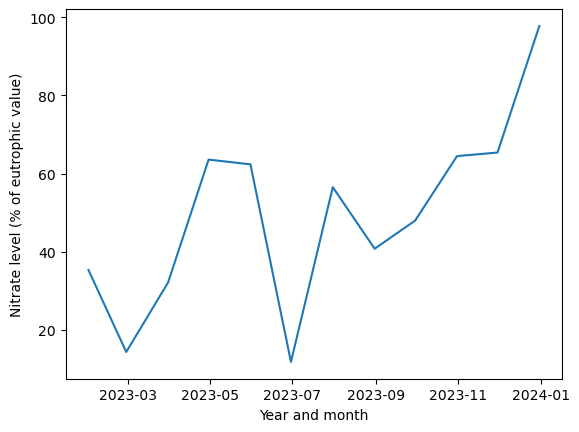

In [6]:
numdates = 12
np.random.seed(0)
time_series = 100 * (np.random.normal(size = numdates) / 5 + np.arange(numdates) / 16)
datearray = pd.date_range(start='2023/01/01', end='2024/01/01', freq='M')
ax = sns.lineplot(x = datearray, y = time_series)
ax.set_xlabel("Year and month")
ax.set_ylabel("Nitrate level (% of eutrophic value)")

Text(0, 0.5, 'Phosphate level (% of eutrophic value)')

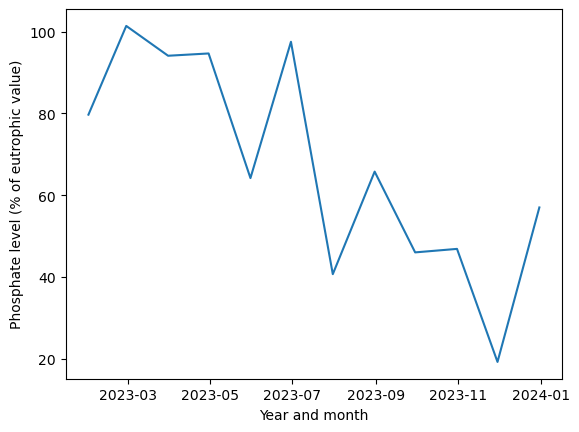

In [7]:
np.random.seed(1)
time_series_2 =  100 * (1 - (np.random.normal(size = numdates) / 8 + np.arange(numdates) / 16))
datearray = pd.date_range(start='2023/01/01', end='2024/01/01', freq='M')
ax = sns.lineplot(x = datearray, y = time_series_2)
ax.set_xlabel("Year and month")
ax.set_ylabel("Phosphate level (% of eutrophic value)")

<Axes: >

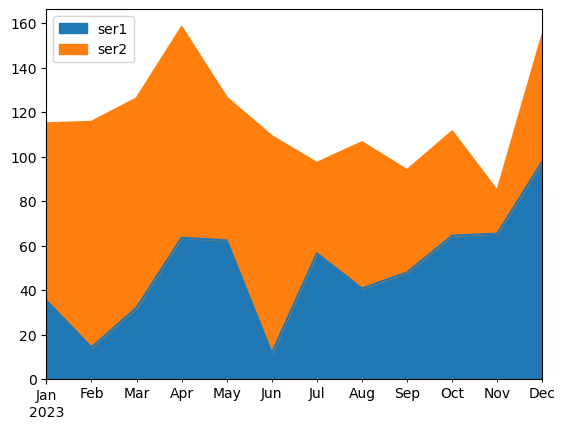

In [8]:
df = pd.DataFrame({'ser1': time_series, 'ser2': time_series_2}, index = datearray)
df.plot.area()

# 3. Working on your datasets

This week, you will do the same types of exercises as last week, but you should use your chosen datasets that someone in your class found last semester. (They likely will not be the particular datasets that you found yourself.)

### Here are some types of analysis you can do:

- Find correlations between pairs of variables.

- Draw scatterplots, especially when the correlation is large.

- Draw pairplots.

- Draw line graphs and/or area graphs when there is date or time data together with numerical data.

### Conclusions:

- Explain what conclusions you would draw from this analysis: are the data what you expect?  Are the data likely to be usable?  If the data are not useable, find some new data!

- Do you see any outliers?  (Data points that are far from the rest of the data).

- Are any data items highly correlated with each other, suggesting that they are redundant?

- For the line plots, do you see a trend or pattern over time?  Does this suggest that the data are changing over time (drifting) in such a way as to invalidate comparisons?

- Can you think of any confounding variables?  (Third variables that could explain any correlations between other variables.  These third variables may or may not be reported in the dataset.)

In [9]:
NUSW_NB15_TEST_DF = pd.read_csv('C:/Users/kmisra/Downloads/BU_Python_Checks/Spring_2025/unsw-nb15/UNSW_NB15_training-set.csv')

In [10]:
NUSW_NB15_TEST_DF

,id,dur,proto,service,state,spkts,dpkts,sbytes,dbytes,rate,...,ct_dst_sport_ltm,ct_dst_src_ltm,is_ftp_login,ct_ftp_cmd,ct_flw_http_mthd,ct_src_ltm,ct_srv_dst,is_sm_ips_ports,attack_cat,label
0,1,0.000011,udp,-,INT,2,0,496,0,90909.090200,...,1,2,0,0,0,1,2,0,Normal,0
1,2,0.000008,udp,-,INT,2,0,1762,0,125000.000300,...,1,2,0,0,0,1,2,0,Normal,0
2,3,0.000005,udp,-,INT,2,0,1068,0,200000.005100,...,1,3,0,0,0,1,3,0,Normal,0
3,4,0.000006,udp,-,INT,2,0,900,0,166666.660800,...,1,3,0,0,0,2,3,0,Normal,0
4,5,0.000010,udp,-,INT,2,0,2126,0,100000.002500,...,1,3,0,0,0,2,3,0,Normal,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
82327,82328,0.000005,udp,-,INT,2,0,104,0,200000.005100,...,1,2,0,0,0,2,1,0,Normal,0
82328,82329,1.106101,tcp,-,FIN,20,8,18062,354,24.410067,...,1,1,0,0,0,3,2,0,Normal,0
82329,82330,0.000000,arp,-,INT,1,0,46,0,0.000000,...,1,1,0,0,0,1,1,1,Normal,0
82330,82331,0.000000,arp,-,INT,1,0,46,0,0.000000,...,1,1,0,0,0,1,1,1,Normal,0


In [11]:
NUSW_NB15_TEST_DF.columns

Index(['id', 'dur', 'proto', 'service', 'state', 'spkts', 'dpkts', 'sbytes',
       'dbytes', 'rate', 'sttl', 'dttl', 'sload', 'dload', 'sloss', 'dloss',
       'sinpkt', 'dinpkt', 'sjit', 'djit', 'swin', 'stcpb', 'dtcpb', 'dwin',
       'tcprtt', 'synack', 'ackdat', 'smean', 'dmean', 'trans_depth',
       'response_body_len', 'ct_srv_src', 'ct_state_ttl', 'ct_dst_ltm',
       'ct_src_dport_ltm', 'ct_dst_sport_ltm', 'ct_dst_src_ltm',
       'is_ftp_login', 'ct_ftp_cmd', 'ct_flw_http_mthd', 'ct_src_ltm',
       'ct_srv_dst', 'is_sm_ips_ports', 'attack_cat', 'label'],
      dtype='object')

In [12]:
NUSW_NB15_TEST_DF.shape

(82332, 45)

In [13]:
NUSW_NB15_TEST_DF.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 82332 entries, 0 to 82331
Data columns (total 45 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   id                 82332 non-null  int64  
 1   dur                82332 non-null  float64
 2   proto              82332 non-null  object 
 3   service            82332 non-null  object 
 4   state              82332 non-null  object 
 5   spkts              82332 non-null  int64  
 6   dpkts              82332 non-null  int64  
 7   sbytes             82332 non-null  int64  
 8   dbytes             82332 non-null  int64  
 9   rate               82332 non-null  float64
 10  sttl               82332 non-null  int64  
 11  dttl               82332 non-null  int64  
 12  sload              82332 non-null  float64
 13  dload              82332 non-null  float64
 14  sloss              82332 non-null  int64  
 15  dloss              82332 non-null  int64  
 16  sinpkt             823

In [14]:
NUSW_NB15_TEST_DF = NUSW_NB15_TEST_DF.set_index('id')

<b> Column "Id" is a index column which does not have any other value in this dataset, so making it the index of the dataset.

In [15]:
NUSW_NB15_TEST_DF

,dur,proto,service,state,spkts,dpkts,sbytes,dbytes,rate,sttl,...,ct_dst_sport_ltm,ct_dst_src_ltm,is_ftp_login,ct_ftp_cmd,ct_flw_http_mthd,ct_src_ltm,ct_srv_dst,is_sm_ips_ports,attack_cat,label
id,,,,,,,,,,,,,,,,,,,,,
1,0.000011,udp,-,INT,2,0,496,0,90909.090200,254,...,1,2,0,0,0,1,2,0,Normal,0
2,0.000008,udp,-,INT,2,0,1762,0,125000.000300,254,...,1,2,0,0,0,1,2,0,Normal,0
3,0.000005,udp,-,INT,2,0,1068,0,200000.005100,254,...,1,3,0,0,0,1,3,0,Normal,0
4,0.000006,udp,-,INT,2,0,900,0,166666.660800,254,...,1,3,0,0,0,2,3,0,Normal,0
5,0.000010,udp,-,INT,2,0,2126,0,100000.002500,254,...,1,3,0,0,0,2,3,0,Normal,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
82328,0.000005,udp,-,INT,2,0,104,0,200000.005100,254,...,1,2,0,0,0,2,1,0,Normal,0
82329,1.106101,tcp,-,FIN,20,8,18062,354,24.410067,254,...,1,1,0,0,0,3,2,0,Normal,0
82330,0.000000,arp,-,INT,1,0,46,0,0.000000,0,...,1,1,0,0,0,1,1,1,Normal,0


In [16]:
NUSW_NB15_TEST_DF_Dedup = NUSW_NB15_TEST_DF.drop_duplicates()

In [17]:
NUSW_NB15_TEST_DF_Dedup.shape

(55945, 44)

In [18]:
NUSW_NB15_TEST_DF.shape

(82332, 44)

In [19]:
print("There are duplicate records in this dataset once we make id column as index. The percentage of duplicate is :" , (NUSW_NB15_TEST_DF.shape[0]- NUSW_NB15_TEST_DF_Dedup.shape[0])* 100 /NUSW_NB15_TEST_DF.shape[0] )

There are duplicate records in this dataset once we make id column as index. The percentage of duplicate is : 32.04950687460526


<b>There are duplicate records in this dataset once we make id column as index. The percentage of duplicate is : 32.04950687460526

In [20]:
NUSW_NB15_TEST_DF_Dedup.describe()

,dur,spkts,dpkts,sbytes,dbytes,rate,sttl,dttl,sload,dload,...,ct_src_dport_ltm,ct_dst_sport_ltm,ct_dst_src_ltm,is_ftp_login,ct_ftp_cmd,ct_flw_http_mthd,ct_src_ltm,ct_srv_dst,is_sm_ips_ports,label
count,55945.000000,55945.000000,55945.000000,5.594500e+04,5.594500e+04,5.594500e+04,55945.000000,55945.000000,5.594500e+04,5.594500e+04,...,55945.000000,55945.000000,55945.000000,55945.000000,55945.000000,55945.000000,55945.000000,55945.000000,55945.000000,55945.000000
mean,1.032789,25.114738,25.052301,1.094235e+04,1.915921e+04,4.134040e+04,154.483725,131.665404,4.793749e+07,9.240539e+05,...,2.229601,1.550076,3.908571,0.009420,0.009509,0.155474,3.891590,5.591760,0.004790,0.388578
std,4.090009,158.319713,139.237078,2.035046e+05,1.832721e+05,1.174504e+05,106.568743,117.885885,1.953194e+08,2.853581e+06,...,3.950284,2.534518,6.694282,0.096784,0.097786,0.553929,4.909505,6.960478,0.069047,0.487431
min,0.000000,1.000000,0.000000,2.400000e+01,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000e+00,...,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000
25%,0.001123,2.000000,2.000000,4.840000e+02,1.620000e+02,2.447988e+01,31.000000,29.000000,8.562924e+03,1.224116e+03,...,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000
50%,0.351012,10.000000,8.000000,8.580000e+02,3.540000e+02,7.285038e+01,254.000000,29.000000,4.809731e+04,5.157814e+03,...,1.000000,1.000000,2.000000,0.000000,0.000000,0.000000,2.000000,3.000000,0.000000,0.000000
75%,0.916043,16.000000,18.000000,2.058000e+03,1.728000e+03,4.210005e+03,254.000000,252.000000,1.368204e+06,1.668179e+05,...,2.000000,1.000000,4.000000,0.000000,0.000000,0.000000,4.000000,7.000000,0.000000,1.000000
max,59.999989,10646.000000,11018.000000,1.435577e+07,1.465753e+07,1.000000e+06,255.000000,253.000000,5.268000e+09,2.082111e+07,...,59.000000,38.000000,63.000000,2.000000,2.000000,16.000000,60.000000,62.000000,1.000000,1.000000


<b> Label is the target column of this dataset and it is showing around 38% of data is positive and others is negative.

<b>Below are the non-numerical columns

In [21]:
def print_non_numerical_columns(df):
    non_numerical_cols = df.select_dtypes(exclude=['number']).columns.tolist()
    if non_numerical_cols:
        print("Non-numerical columns:")
        for col in non_numerical_cols:
            print(col)
    else:
        print("No non-numerical columns found.")

print_non_numerical_columns(NUSW_NB15_TEST_DF_Dedup)

Non-numerical columns:
proto
service
state
attack_cat


In [22]:
import matplotlib as plt 

In [23]:
NUSW_NB15_TEST_DF_Dedup['proto'].value_counts()

proto
tcp           40559
udp           12541
unas            885
arp             298
ospf            190
              ...  
wb-mon           10
br-sat-mon       10
pvp              10
wsn              10
ib                9
Name: count, Length: 131, dtype: int64

In [24]:
NUSW_NB15_TEST_DF_Dedup['service'].value_counts()

service
-           37027
http         7930
dns          6091
smtp         1759
ftp          1291
ftp-data     1177
pop3          381
ssh           204
ssl            30
snmp           25
dhcp           19
radius          6
irc             5
Name: count, dtype: int64

In [25]:
NUSW_NB15_TEST_DF_Dedup['state'].value_counts()

state
FIN    37355
INT    10646
CON     6711
REQ     1227
ACC        4
RST        1
CLO        1
Name: count, dtype: int64

In [26]:
NUSW_NB15_TEST_DF_Dedup['attack_cat'].value_counts()

attack_cat
Normal            34206
Exploits           7609
Fuzzers            4838
Generic            3657
Reconnaissance     2703
DoS                1718
Analysis            446
Shellcode           378
Backdoor            346
Worms                44
Name: count, dtype: int64

<b> Creating ordinal encoding for the "attack_cat" columns

<b>Preprocessing of the columns

In [27]:
from sklearn.preprocessing import OrdinalEncoder

In [28]:
encoder = OrdinalEncoder(categories=[['Normal', 'Exploits', 'Fuzzers','Generic','Reconnaissance','DoS','Analysis','Shellcode','Backdoor','Worms']])
NUSW_NB15_TEST_DF_Dedup['attack_cat_code'] = encoder.fit_transform(NUSW_NB15_TEST_DF_Dedup[['attack_cat']])

C:\Users\kmisra\AppData\Local\Temp\ipykernel_30120\3140328.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  NUSW_NB15_TEST_DF_Dedup['attack_cat_code'] = encoder.fit_transform(NUSW_NB15_TEST_DF_Dedup[['attack_cat']])


In [29]:
NUSW_NB15_TEST_DF_Dedup['service'].value_counts()

service
-           37027
http         7930
dns          6091
smtp         1759
ftp          1291
ftp-data     1177
pop3          381
ssh           204
ssl            30
snmp           25
dhcp           19
radius          6
irc             5
Name: count, dtype: int64

In [30]:
encoder_service = OrdinalEncoder(categories=[['-', 'http', 'dns','smtp','ftp','ftp-data','pop3','ssh','ssl','snmp','dhcp','radius','irc']])
NUSW_NB15_TEST_DF_Dedup['service_code'] = encoder_service.fit_transform(NUSW_NB15_TEST_DF_Dedup[['service']])

C:\Users\kmisra\AppData\Local\Temp\ipykernel_30120\208422048.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  NUSW_NB15_TEST_DF_Dedup['service_code'] = encoder_service.fit_transform(NUSW_NB15_TEST_DF_Dedup[['service']])


<b> As per the analysis, it looks that we don't need the 'state' column as it does not have any relation with the attack. So, dropping the column.

In [31]:
NUSW_NB15_TEST_DF_Dedup.drop(columns='state', inplace=True)

C:\Users\kmisra\AppData\Local\Temp\ipykernel_30120\2051716013.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  NUSW_NB15_TEST_DF_Dedup.drop(columns='state', inplace=True)


array([[<Axes: title={'center': 'dur'}>,
        <Axes: title={'center': 'spkts'}>,
        <Axes: title={'center': 'dpkts'}>,
        <Axes: title={'center': 'sbytes'}>,
        <Axes: title={'center': 'dbytes'}>,
        <Axes: title={'center': 'rate'}>],
       [<Axes: title={'center': 'sttl'}>,
        <Axes: title={'center': 'dttl'}>,
        <Axes: title={'center': 'sload'}>,
        <Axes: title={'center': 'dload'}>,
        <Axes: title={'center': 'sloss'}>,
        <Axes: title={'center': 'dloss'}>],
       [<Axes: title={'center': 'sinpkt'}>,
        <Axes: title={'center': 'dinpkt'}>,
        <Axes: title={'center': 'sjit'}>,
        <Axes: title={'center': 'djit'}>,
        <Axes: title={'center': 'swin'}>,
        <Axes: title={'center': 'stcpb'}>],
       [<Axes: title={'center': 'dtcpb'}>,
        <Axes: title={'center': 'dwin'}>,
        <Axes: title={'center': 'tcprtt'}>,
        <Axes: title={'center': 'synack'}>,
        <Axes: title={'center': 'ackdat'}>,
        <A

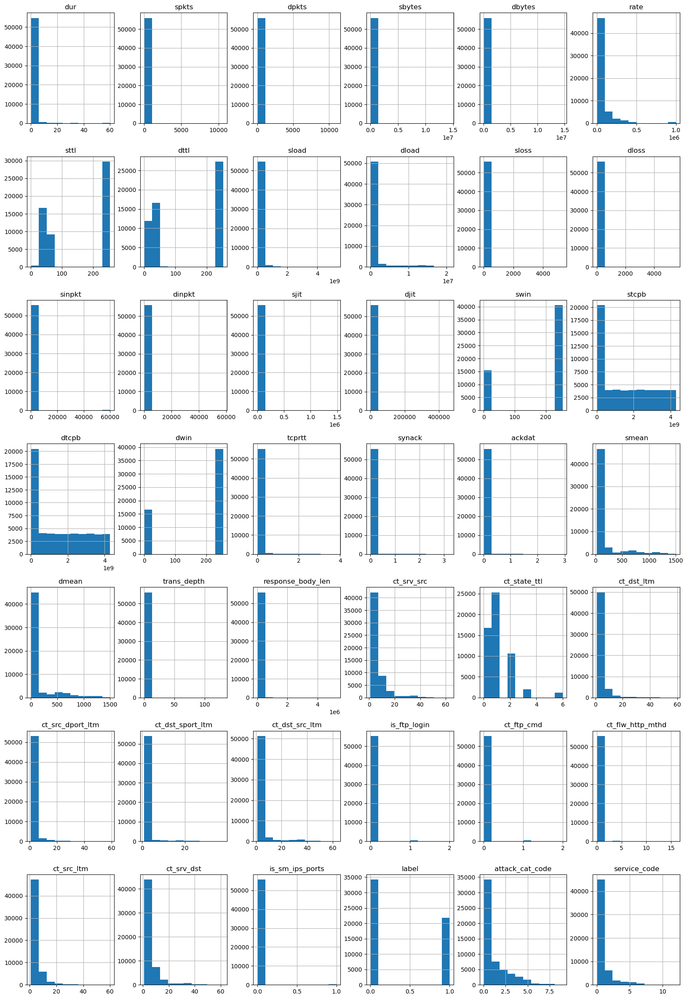

In [32]:
NUSW_NB15_TEST_DF_Dedup.hist(figsize=(20,30))

<b>Univariate analysis <br></b>
Out of all the columns below are the columns which are not Numerical and they are Categorical, and after analyzing it is found that they are Nominal as they don't have any inherent order.
<br>
<br>proto
<br>service
<br>state
<br>attack_cat



In [33]:
import matplotlib as plt

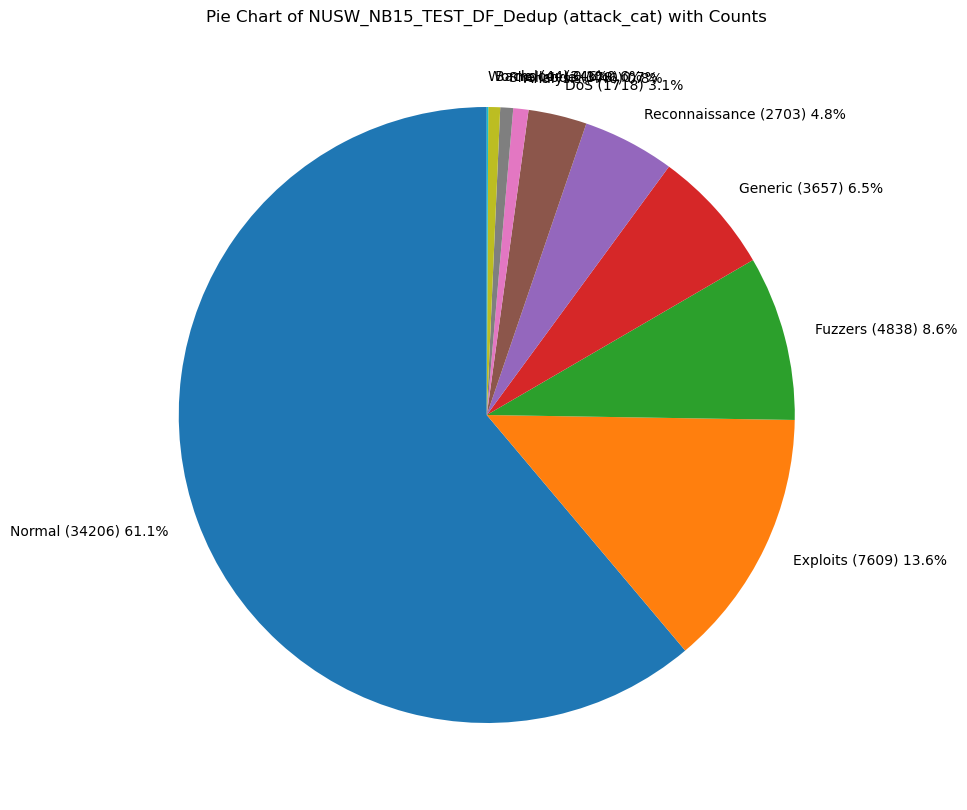

In [34]:
import matplotlib.pyplot as plt
import pandas as pd #make sure you have pandas as well

# Your code:

category_counts = NUSW_NB15_TEST_DF_Dedup['attack_cat'].value_counts()

plt.figure(figsize=(15, 10))

labels = [f'{category} ({count}) {percentage:.1f}%'
          for category, count, percentage in zip(category_counts.index,
                                                  category_counts,
                                                  100 * category_counts / category_counts.sum())]

plt.pie(category_counts, labels=labels, startangle=90)
plt.title(f'Pie Chart of NUSW_NB15_TEST_DF_Dedup (attack_cat) with Counts')
plt.show()

<b> Correlation of the Features

In [35]:
def find_correlations(df, method='pearson'):
  try:
    # Select only numerical columns
    numerical_df = df.select_dtypes(include=['number'])

    # Calculate the correlation matrix
    corr_matrix = numerical_df.corr(method=method)

    # Display the correlation matrix
    print(corr_matrix)

  except ValueError:
    print("No numerical columns found in the DataFrame.")

# Example usage:
find_correlations(NUSW_NB15_TEST_DF_Dedup)  # Uses Pearson correlation by default
# find_correlations(NUSW_NB15_TEST_DF_Dedup, method='spearman')  # Use Spearman correlation

                        dur     spkts     dpkts    sbytes    dbytes      rate  \
dur                1.000000  0.353612  0.292426  0.296368  0.239560 -0.088447   
spkts              0.353612  1.000000  0.364799  0.966281  0.199104 -0.050198   
dpkts              0.292426  0.364799  1.000000  0.170187  0.978141 -0.061778   
sbytes             0.296368  0.966281  0.170187  1.000000  0.008519 -0.018284   
dbytes             0.239560  0.199104  0.978141  0.008519  1.000000 -0.036080   
rate              -0.088447 -0.050198 -0.061778 -0.018284 -0.036080  1.000000   
sttl               0.028392 -0.072015 -0.142302 -0.006150 -0.104913  0.310750   
dttl               0.078259  0.017167 -0.017066  0.041710 -0.018612 -0.391312   
sload             -0.061708 -0.035307 -0.043783 -0.011802 -0.025559  0.534507   
dload             -0.068786  0.064211  0.118719 -0.011358  0.091627 -0.102030   
sloss              0.311773  0.973797  0.181281  0.996228  0.012134 -0.029349   
dloss              0.236951 

In [36]:
NUSW_NB15_TEST_DF_Dedup.drop(columns='proto',inplace=True)

C:\Users\kmisra\AppData\Local\Temp\ipykernel_30120\708591126.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  NUSW_NB15_TEST_DF_Dedup.drop(columns='proto',inplace=True)


In [37]:
NUSW_NB15_TEST_DF_Dedup.drop(columns='service',inplace=True)

C:\Users\kmisra\AppData\Local\Temp\ipykernel_30120\2047263962.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  NUSW_NB15_TEST_DF_Dedup.drop(columns='service',inplace=True)


In [38]:
NUSW_NB15_TEST_DF_Dedup.drop(columns='attack_cat',inplace=True)

C:\Users\kmisra\AppData\Local\Temp\ipykernel_30120\3012230756.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  NUSW_NB15_TEST_DF_Dedup.drop(columns='attack_cat',inplace=True)


<Axes: title={'center': 'Correlation Plot'}>

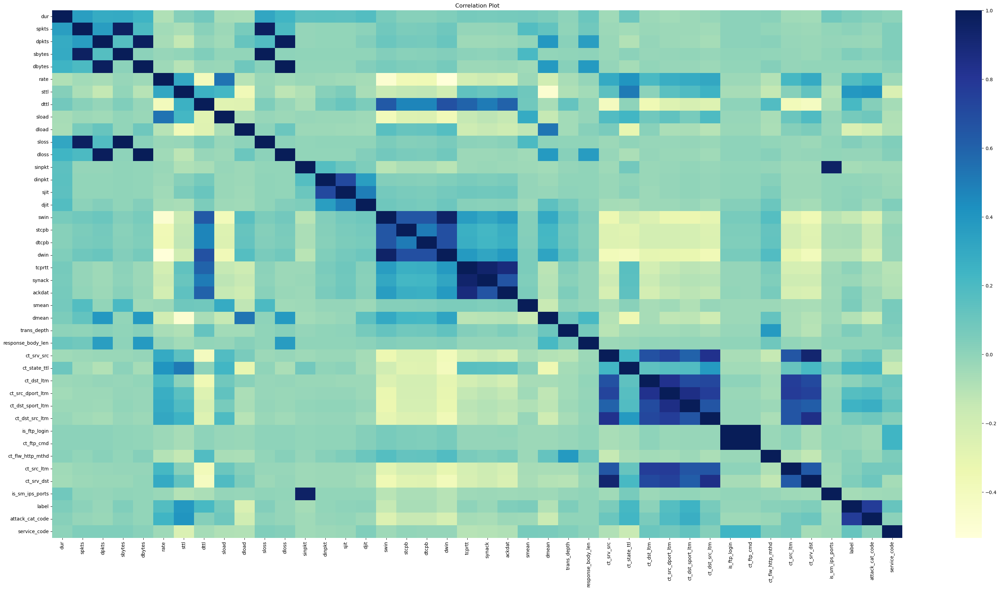

In [39]:
import seaborn as sns


plt.figure(figsize=(40,20))
plt.title("Correlation Plot")
sns.heatmap(NUSW_NB15_TEST_DF_Dedup.corr(),cmap='YlGnBu')

Highly Correlated Features

In [40]:
# Calculate the correlation matrix
correlation_matrix = NUSW_NB15_TEST_DF_Dedup.corr()

# Create a mask to identify the features with a correlation coefficient greater than or equal to 0.75
high_correlation_mask = correlation_matrix >= 0.75

# Identify and list the highly correlated features
highly_correlated_features = []

for feature in high_correlation_mask.columns:
    correlated_with = high_correlation_mask.index[high_correlation_mask[feature]].tolist()
    for correlated_feature in correlated_with:
        if feature != correlated_feature and (correlated_feature, feature) not in highly_correlated_features:
            highly_correlated_features.append((feature, correlated_feature))

# Print the highly correlated features
print("Highly correlated features:")
for feature1, feature2 in highly_correlated_features:
    print(f"{feature1} and {feature2}")

Highly correlated features:
spkts and sbytes
spkts and sloss
dpkts and dbytes
dpkts and dloss
sbytes and sloss
dbytes and dloss
sinpkt and is_sm_ips_ports
swin and dwin
tcprtt and synack
tcprtt and ackdat
ct_srv_src and ct_dst_src_ltm
ct_srv_src and ct_srv_dst
ct_dst_ltm and ct_src_dport_ltm
ct_dst_ltm and ct_src_ltm
ct_src_dport_ltm and ct_dst_sport_ltm
ct_src_dport_ltm and ct_dst_src_ltm
ct_src_dport_ltm and ct_src_ltm
ct_dst_src_ltm and ct_srv_dst
is_ftp_login and ct_ftp_cmd
label and attack_cat_code


<b>Creating Pairplot for bivariate analysis

In [41]:
## Use Gemini to generate some parts of the Script

def bivariate_analysis(df):
    plt.figure(figsize=(12, 8))
    correlation_matrix = df.corr()

    # pairplot with KDE
    print("generating pairplot ...")
    sns.pairplot(df.sample(1000), hue='label', diag_kind='kde')
    plt.show()


In [42]:
bivariate_analysis(NUSW_NB15_TEST_DF_Dedup)

generating pairplot ...


c:\Users\kmisra\AppData\Local\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 1200x800 with 0 Axes>

### Conclusions:

- Explain what conclusions you would draw from this analysis: are the data what you expect?  Are the data likely to be usable?  If the data are not useable, find some new data!
<br><b>Ans: </b><br>
This data is usable as there are enough data available for the analysis. There are 35 numerical columns and 5 categorical columns which has high corelation with the target value 'label'.

- Do you see any outliers?  (Data points that are far from the rest of the data).
<br><b>Ans: </b><br>
There are outlier present for the below columns.<br>
dur, spkts , dpkts 

- Are any data items highly correlated with each other, suggesting that they are redundant?
<br><b>Ans: </b><br>
According to the columns (spkts,sytes) , (dpkts, dbytes) highly correlated and they are actually redundant.

- For the line plots, do you see a trend or pattern over time?  Does this suggest that the data are changing over time (drifting) in such a way as to invalidate comparisons?
<br><b>Ans: </b><br>
There is no trend or pattern over time. 

- Can you think of any confounding variables?  (Third variables that could explain any correlations between other variables.  These third variables may or may not be reported in the dataset.)
<br><b>Ans: </b><br>
I don't find any confounding variables for this dataset.


# 4. Storytelling With Data plot

Reproduce any graph of your choice in p. 86-98 of the Storytelling With Data book as best you can.  (The second half of chapter three).  You do not have to get the exact data values right, just the overall look and feel.

<b>FIGURE 3.23 Leverage consistent color

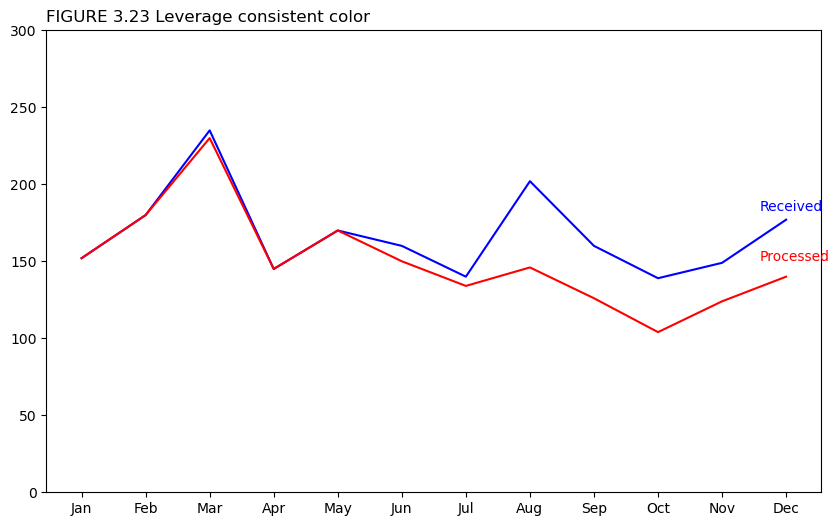

In [43]:
months = np.array(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
XYZ_Tickets = pd.DataFrame(months)
XYZ_Tickets.columns = ['Month']
XYZ_Tickets['Received'] = pd.DataFrame([152,180,235,145,170,160,140,202,160,139,149,177])
XYZ_Tickets['Processed'] = pd.DataFrame([152,180,230,145,170,150,134,146,126,104,124,140])
XYZ_Tickets

plt.figure(figsize=(10,6))
plt.plot(XYZ_Tickets['Month'],XYZ_Tickets['Received'],color='blue')
plt.plot(XYZ_Tickets['Month'],XYZ_Tickets['Processed'],color='red')
#plt.axvline(x='May', color='grey', linestyle='-', label='May Event')
plt.ylim(0,300)
#plt.text(0.25, 0.95, "2 employees quit in May. ", fontweight='bold',transform=plt.gca().transAxes)
#plt.text(0.50, 0.95, " We nearly kept ip with incoming volume ", transform=plt.gca().transAxes)
#plt.text(0.25, 0.92, " in the following two months, but fell behind with the increase in Aug ", transform=plt.gca().transAxes)
#plt.text(0.25, 0.89, "and haven't been able to catch up since.", transform=plt.gca().transAxes)
plt.text(0.92, 0.61, "Received",  color='blue',transform=plt.gca().transAxes)
plt.text(0.92, 0.50, "Processed", color='red', transform=plt.gca().transAxes)
#plt.xlabel("2014",loc='left')
#plt.ylabel("Number of tickets",loc='top')
plt.title("FIGURE 3.23 Leverage consistent color",loc='left')
plt.show()